# RoboFlow Inference

In [1]:
                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                            # Env variables
from dotenv import load_dotenv
import os

load_dotenv()

api_key = os.getenv("roboflow_api_key")
os.environ["MODEL_CACHE_DIR"] = "./model_cache"

import cv2
import numpy as np
from inference.models.utils import get_model

# Confirm that the API key is set
if api_key == None:
    print("Please set the API key in the .env file")


SupervisionWarnings: BoundingBoxAnnotator is deprecated: `BoundingBoxAnnotator` is deprecated and has been renamed to `BoxAnnotator`. `BoundingBoxAnnotator` will be removed in supervision-0.26.0.


In [2]:
# Roboflow model
model_name = "open-shelves"
model_version = "8"
model = get_model(model_id = f"{model_name}/{model_version}", api_key=api_key)
model.confidence = 0.3
model.overlap = 0.7


In [3]:
from io import BytesIO

import requests
import supervision as sv
from inference import get_model
from PIL import Image
from PIL.ImageFile import ImageFile


def load_image_from_url(url: str) -> ImageFile:
    response = requests.get(url)
    response.raise_for_status()  # check if the request was successful
    image = Image.open(BytesIO(response.content))
    return image

def load_image_from_path(path: str) -> ImageFile:
    image = Image.open(path)
    return image

In [4]:
def display_image_with_detections(orginal_image, detections):
    image = orginal_image.copy()
    # create supervision annotators
    bounding_box_annotator = sv.BoxAnnotator()
    label_annotator = sv.LabelAnnotator()
    mask_annotator = sv.MaskAnnotator()

    # annotate the image with our inference results
    annotated_image = bounding_box_annotator.annotate(scene=image, detections=detections)
    annotated_image = label_annotator.annotate(scene=annotated_image, detections=detections)
    annotated_image = mask_annotator.annotate(scene=annotated_image, detections=detections)

    # display the image
    sv.plot_image(annotated_image)

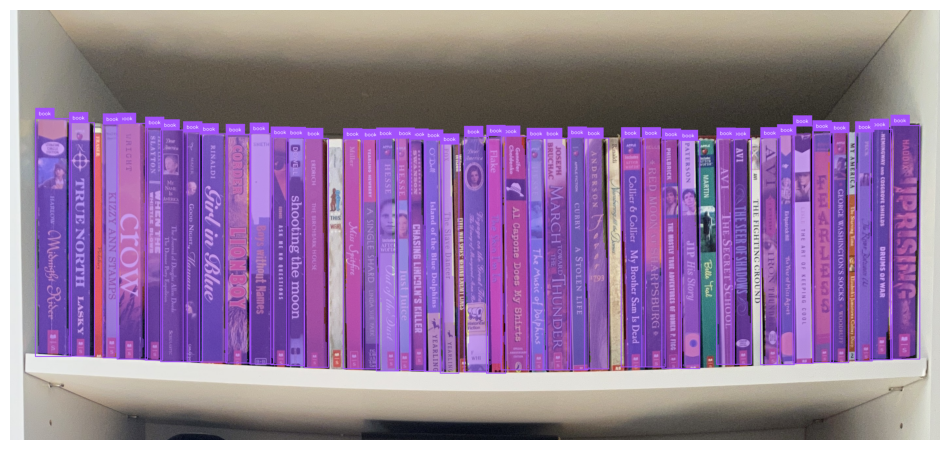

In [5]:


# load the image from an url
image = load_image_from_path("../../images/Shelves/1538_1.jpg")

# run inference on our chosen image, image can be a url, a numpy array, a PIL image, etc.
results = model.infer(image)[0]
# load the results into the supervision Detections api
detections = sv.Detections.from_inference(results)

# display the image with the inference results
display_image_with_detections(image, detections)

In [6]:
print(results)

visualization=None inference_id=None frame_id=None time=None image=InferenceResponseImage(width=2837, height=1313) predictions=[InstanceSegmentationPrediction(x=934.0, y=742.5, width=74.0, height=697.0, confidence=0.8942611217498779, class_name='book', class_confidence=None, points=[Point(x=899.8609375, y=393.90000000000003), Point(x=899.8609375, y=404.15781250000003), Point(x=904.2937499999999, y=406.209375), Point(x=904.2937499999999, y=1087.328125), Point(x=908.7265625, y=1089.3796875), Point(x=966.353125, y=1089.3796875), Point(x=966.353125, y=1015.5234375000001), Point(x=961.9203124999999, y=1013.4718750000001), Point(x=961.9203124999999, y=960.1312500000001), Point(x=957.4875, y=958.0796875000001), Point(x=957.4875, y=908.8421875), Point(x=961.9203124999999, y=906.7906250000001), Point(x=961.9203124999999, y=851.3984375000001), Point(x=957.4875, y=849.3468750000001), Point(x=957.4875, y=845.2437500000001), Point(x=961.9203124999999, y=843.1921875), Point(x=961.9203124999999, y=80

In [7]:
class DetectionResult:
    def __init__(self, bounding_box, polygon):
        self.bounding_box = np.array(bounding_box, dtype=int)
        self.polygon = np.array([(int(p.x), int(p.y)) for p in polygon])
        epsilon = max(bounding_box[2] - bounding_box[0], bounding_box[3] - bounding_box[1]) * 0.02
        polygon = cv2.approxPolyDP(polygon, epsilon, True)
        polygon = polygon.reshape(-1, 2)

class DetectionResults:
    def __init__(self, bounding_boxes, polygons):
        results = [DetectionResult(bounding_box, polygon) for bounding_box, polygon in zip(bounding_boxes, polygons)]
    
    def sort(self):
         results.sort(key=lambda x: x.bounding_box[0])

def segment_books(image, results, detections):
    # Get the bounding boxes
    
    bounding_boxes = [d[0] for d in detections]
    polygons = [p.points for p in results.predictions]

    detection_results = DetectionResults(bounding_boxes, polygons)

    # Sort the bounding boxes by x
    detection_results.sort()

    from matplotlib import pyplot as plt

    books = []

    # Segment the image using cv2
    for result in detection_results.results:
        box = result.bounding_box
        # Get the bounding box coordinates
        x1, y1, x2, y2 = box
        # Crop the image
        book = image.crop((x1, y1, x2, y2))
        # Mask the image to show only the interior of the polygon using cv2 
        polygon = [(x - x1, y - y1) for x, y in result.polygon]
        mask = np.zeros((y2 - y1, x2 - x1), dtype=np.uint8)
        cv2.fillPoly(mask, [np.array(polygon)], 255)
        masked_book = cv2.bitwise_and(np.array(book), np.array(book), mask=mask)
        books.append(masked_book)
    return books

def display_segmented_books(books):
    import matplotlib.pyplot as plt
    # Display the segmented images
    fig, axes = plt.subplots(1, len(books), figsize=(20, 10))
    for i, book in enumerate(books):
        axes[i].imshow(book)
        axes[i].axis("off")
    plt.show()



## Test Book images generation

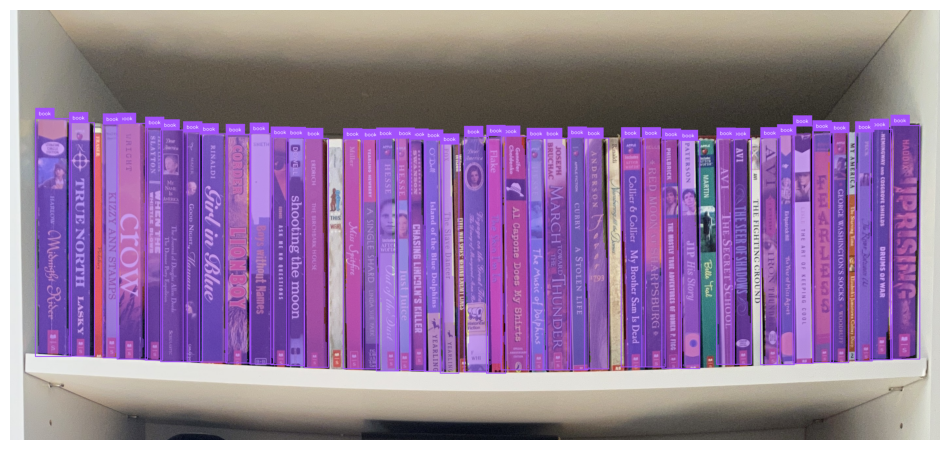

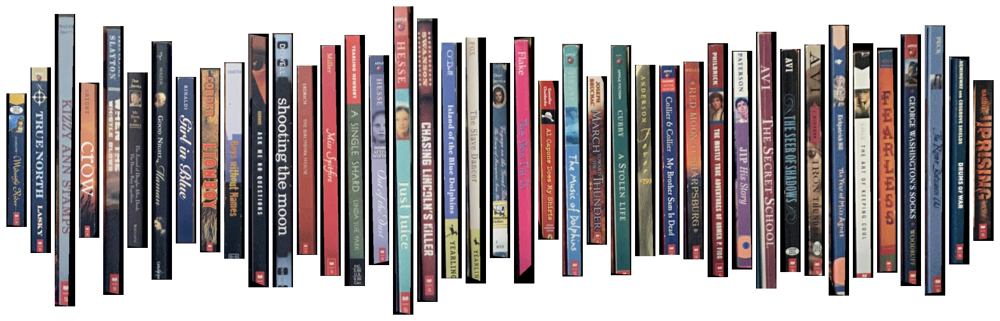

Image: 1538_1.jpg. 
Load time: 0.011100292205810547. Inference time: 1.3589246273040771. Display time: 1.70265793800354. Segmentation time: 0.009294748306274414


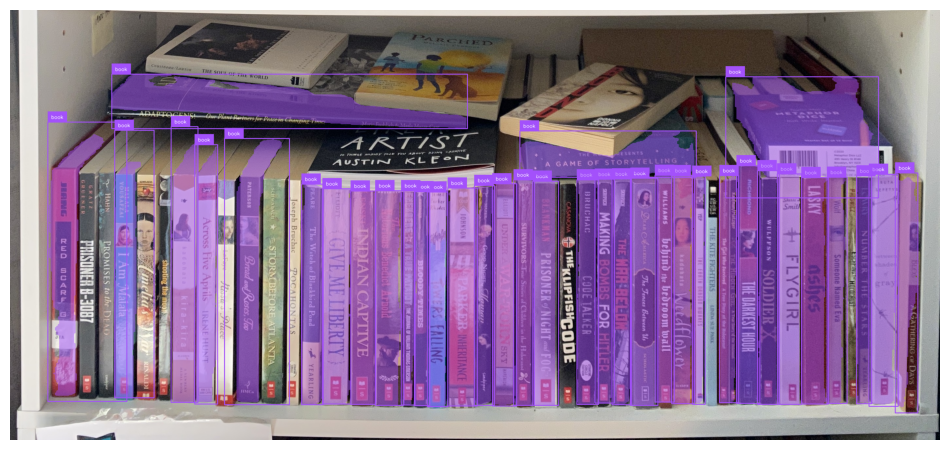

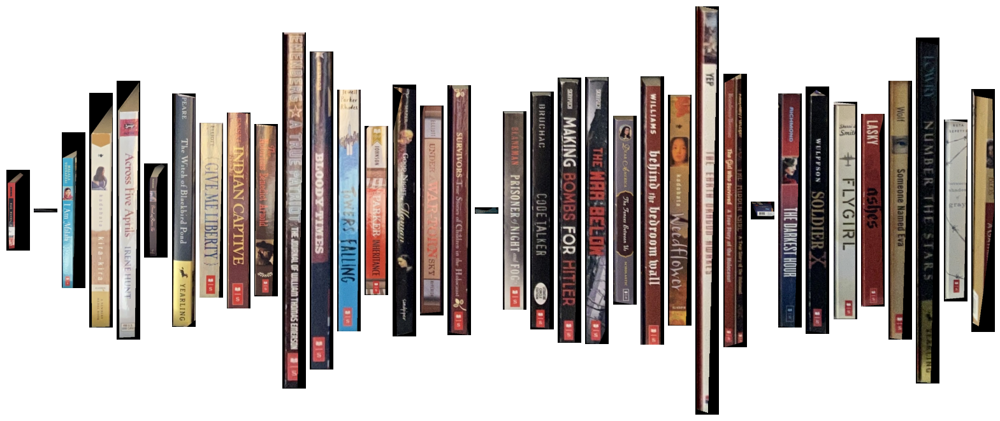

Image: 1538_3.jpg. 
Load time: 0.013409137725830078. Inference time: 0.7510719299316406. Display time: 1.1709914207458496. Segmentation time: 0.011222362518310547


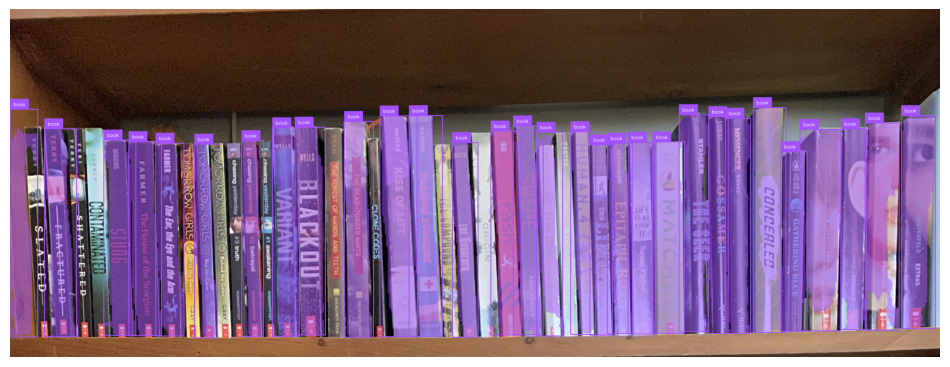

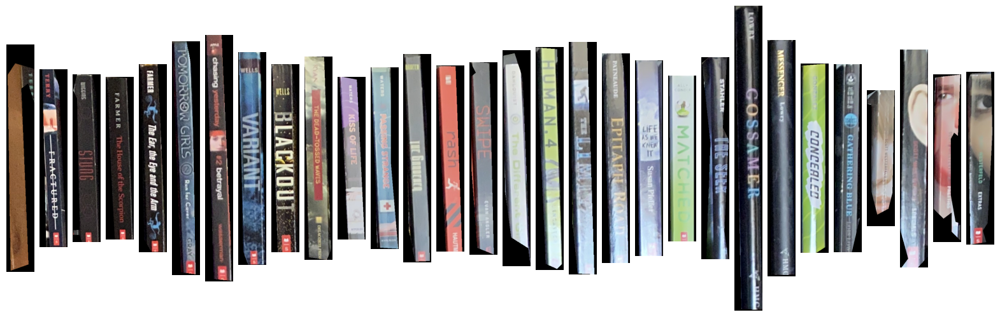

Image: 1539_1.jpg. 
Load time: 0.012203454971313477. Inference time: 0.6726665496826172. Display time: 0.9301910400390625. Segmentation time: 0.008342742919921875


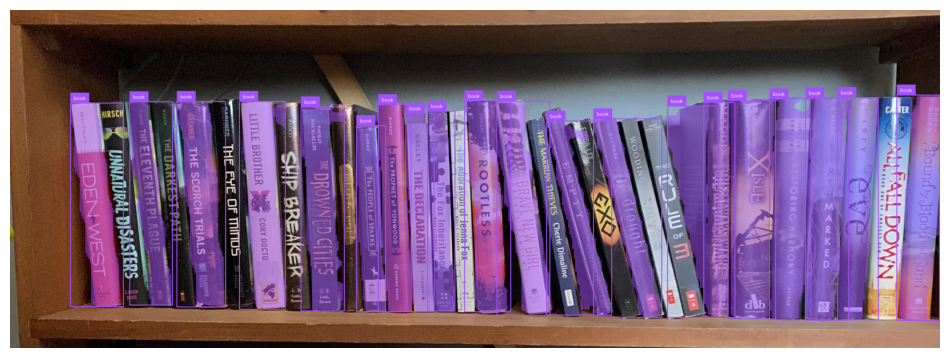

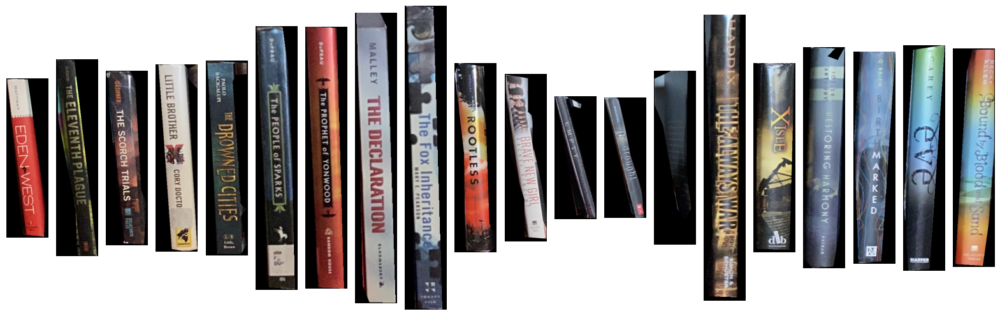

Image: 1539_2.jpg. 
Load time: 0.003429412841796875. Inference time: 0.47731447219848633. Display time: 0.7426443099975586. Segmentation time: 0.008847951889038086


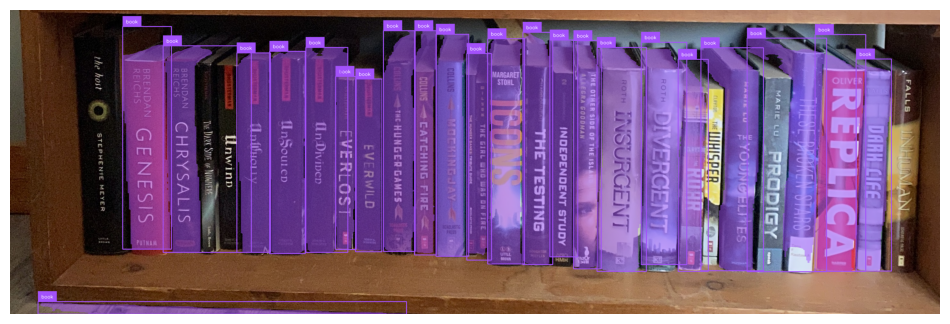

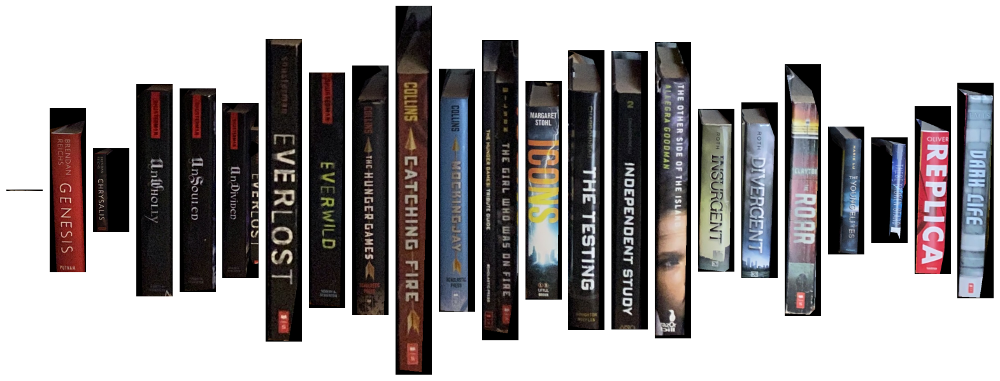

Image: 1539_3.jpg. 
Load time: 0.0011456012725830078. Inference time: 0.7222912311553955. Display time: 0.7089908123016357. Segmentation time: 0.016772031784057617


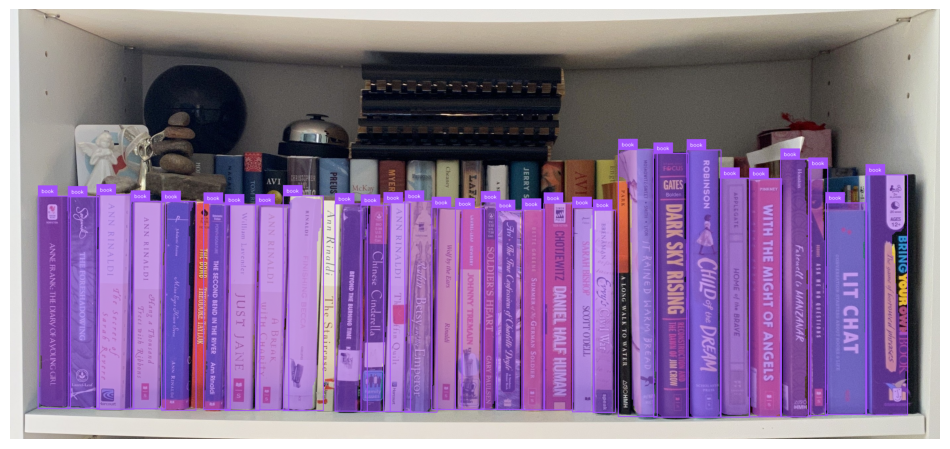

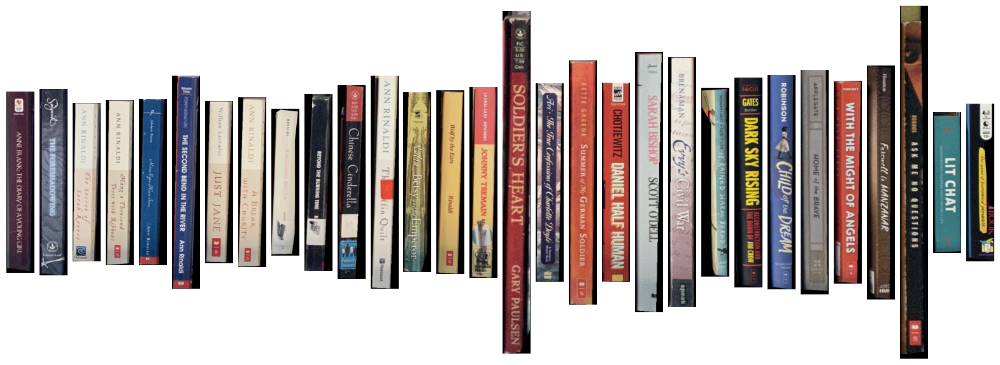

Image: 1538_2.jpg. 
Load time: 0.0013985633850097656. Inference time: 0.8412346839904785. Display time: 1.0098650455474854. Segmentation time: 0.007983922958374023
Total time: 15.080662250518799
Average time per image: 2.5134437084198


In [28]:
filenames = os.listdir("../../images/Shelves")
# Performance analysis
import time
books = []
total_time = time.time()
for filename in filenames:
    image_load_start = time.time()
    image = load_image_from_path(f"../../images/Shelves/{filename}")
    image_load_end = time.time()
    image_inference_start = time.time()
    results = model.infer(image)[0]
    image_inference_end = time.time()
    image_display_start = time.time()
    detections = sv.Detections.from_inference(results)
    display_image_with_detections(image, detections)
    image_display_end = time.time()
    image_segmentation_start = time.time()
    books = segment_books(image, results, detections)
    image_segmentation_end = time.time()
    display_segmented_books(books)
    books.extend(books)
    print(f"Image: {filename}. \nLoad time: {image_load_end - image_load_start}. Inference time: {image_inference_end - image_inference_start}. Display time: {image_display_end - image_display_start}. Segmentation time: {image_segmentation_end - image_segmentation_start}")

total_time = time.time() - total_time

print(f"Total time: {total_time}")
print(f"Average time per image: {total_time / len(filenames)}")

In [29]:
for i, book in enumerate(books):
    book = cv2.cvtColor(np.array(book), cv2.COLOR_RGB2BGR)
    cv2.imwrite(f"../../images/Books/{i}.jpg", book)

# ONNX

In [158]:
import onnxruntime as ort
import numpy as np
import cv2 
from matplotlib import pyplot as plt

ort_session = ort.InferenceSession("OpenShelves8.onnx")
input_name = ort_session.get_inputs()[0].name
output0_name = ort_session.get_outputs()[0].name
output1_name = ort_session.get_outputs()[1].name

def load_image_from_path(path: str) -> ImageFile:
    image = cv2.imread(path)
    return image

def display_image(image):
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    plt.imshow(image)
    plt.axis("off")
    plt.show()

def preprocess(image):
    img = cv2.resize(image, (640, 640))  # Resize to model input size
    img = img.astype(np.float32) / 255.0  # Normalize to [0, 1]
    img = np.transpose(img, (2, 0, 1))  # Change to CHW format
    img = np.expand_dims(img, axis=0)  # Add batch dimension
    return img


In [159]:
test_image = load_image_from_path("../../images/Shelves/1538_1.jpg")
classes = ["book"]
input_tensor = preprocess(test_image)

In [157]:
# read the trained onnx model
net = cv2.dnn.readNetFromONNX('OpenShelves8.onnx') 

# feed the model with processed image
net.setInput(input_tensor)

# run the inference
out = net.forward()
print(out.shape)

(1, 32, 160, 160)


In [160]:
outputs = ort_session.run(None, {input_name: input_tensor})
output0 = outputs[0]
output1 = outputs[1]
print(output0.shape , output1.shape)

(1, 37, 8400) (1, 32, 160, 160)


In [162]:
output_0=np.transpose(np.squeeze(outputs[0])) #remove the batch axis
prototypes=np.squeeze(outputs[1]) #remove the batch axis
print("number of prototypes: ",prototypes.shape[0])
print("number of different classes: ", output_0.shape[1]-4-prototypes.shape[0])

number of prototypes:  32
number of different classes:  1


In [149]:
def draw_detections(img, detection):
    """
    Draws bounding boxes and labels on the input image based on the detected objects.

    Args:
        img: The input image to draw detections on.
        box: Detected bounding box.
        score: Corresponding detection score.
        class_id: Class ID for the detected object.
        track_id: Tracking ID for the object.

    Returns:
        None
    """
    x1, y1, x2, y2 , score, class_id = detection
    if class_id != 73:
        return
    print(f"Box: {detection}")
    color = [0,255,0]
    font = cv2.FONT_HERSHEY_SIMPLEX
    cv2.rectangle(img, (int(x1), int(y1)),
                  (int(x2), int(y2)), color, 2)
    label = f"book: {score:.2f}"
    (label_width, label_height), _ = cv2.getTextSize(label, font, 0.5, 1)
    label_x = x1
    label_y = y1 - 10 if y1 - 10 > label_height else y1 + 10
    cv2.rectangle(img, (label_x, label_y - label_height), (label_x +
                  label_width, label_y + label_height), color, cv2.FILLED)
    cv2.putText(img, label, (label_x, label_y),
                font, 0.5, (0, 0, 0), 1, cv2.LINE_AA)

def postprocess(input_image, output0, output1):
    outputs = np.transpose(np.squeeze(output0[0]))
    num_masks = outputs.shape[
    rows = outputs.shape[0]
    boxes = []
    scores = []
    class_ids = []
    img_height = input_image.shape[0]
    img_width = input_image.shape[1]
    input_height = 640
    input_width = 640
    confidence_thres = 0.3
    iou_thres = 0.7
    x_factor =  img_width /  input_width
    y_factor =  img_height /  input_height

    for i in range(rows):
        classes_scores = outputs[i][4:]
        max_score = np.amax(classes_scores)
        if max_score >=  confidence_thres:
            class_id = np.argmax(classes_scores)
            x, y, w, h = outputs[i][0], outputs[i][1], outputs[i][2], outputs[i][3]
            left = int((x - w / 2) * x_factor)
            top = int((y - h / 2) * y_factor)
            width = int(w * x_factor)
            height = int(h * y_factor)
            class_ids.append(class_id)
            scores.append(max_score)
            boxes.append([left, top, width, height])

    indices = cv2.dnn.NMSBoxes(boxes, scores,  confidence_thres,  iou_thres)

    print("Detections before NMS:")
    for box, score, class_id in zip(boxes, scores, class_ids):
        print(f"Box: {box}, Score: {score}, Class ID: {class_id}")

    detections = []
    if len(indices) > 0:
        for i in indices.flatten():
            box = boxes[i]
            score = scores[i]
            class_id = class_ids[i]
            x1, y1, w, h = box
            x2 = x1 + w
            y2 = y1 + h
            detections.append([x1, y1, x2, y2, score, class_id])

    print("Detections after NMS:")
    print(len(detections))
    for detection in detections:
        print(detection)
    return input_image, detections

Detections before NMS:
Box: [0, 0, 24, 121], Score: 1.2613075971603394, Class ID: 14
Box: [21, 0, 58, 29], Score: 1.0925050973892212, Class ID: 14
Box: [41, 0, 97, 26], Score: 1.078369379043579, Class ID: 14
Box: [111, 0, 62, 27], Score: 1.2814719676971436, Class ID: 14
Box: [120, 0, 100, 56], Score: 1.1085492372512817, Class ID: 14
Box: [119, 0, 177, 54], Score: 0.9859350919723511, Class ID: 14
Box: [117, 0, 288, 41], Score: 0.9647548198699951, Class ID: 14
Box: [136, 0, 300, 33], Score: 0.9166555404663086, Class ID: 14
Box: [162, 0, 281, 37], Score: 0.9219890236854553, Class ID: 14
Box: [202, 0, 269, 39], Score: 0.9159324765205383, Class ID: 14
Box: [206, 0, 301, 40], Score: 0.914419412612915, Class ID: 14
Box: [194, 0, 342, 36], Score: 0.9549379348754883, Class ID: 14
Box: [185, 0, 429, 36], Score: 0.9819446206092834, Class ID: 14
Box: [200, 0, 549, 37], Score: 1.0335073471069336, Class ID: 14
Box: [239, 0, 598, 40], Score: 1.0455975532531738, Class ID: 14
Box: [269, 0, 637, 41], Sc

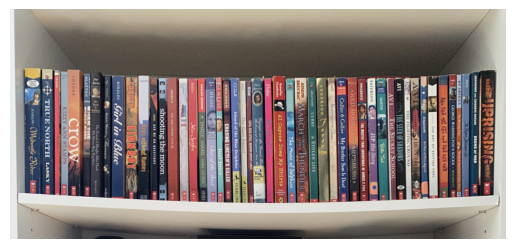

In [150]:
processed_image, detections = postprocess(test_image, output0)  

for detection in detections:
    draw_detections(processed_image, detection)

display_image(processed_image)

In [133]:
output_0=np.squeeze(outputs[0]) #remove the batch axis
prototypes=np.squeeze(outputs[1]) #remove the batch axis
print("number of prototypes: ",prototypes.shape[0])
print("number of different classes: ", output_0.shape[0]-4-prototypes.shape[0])

number of prototypes:  32
number of different classes:  1


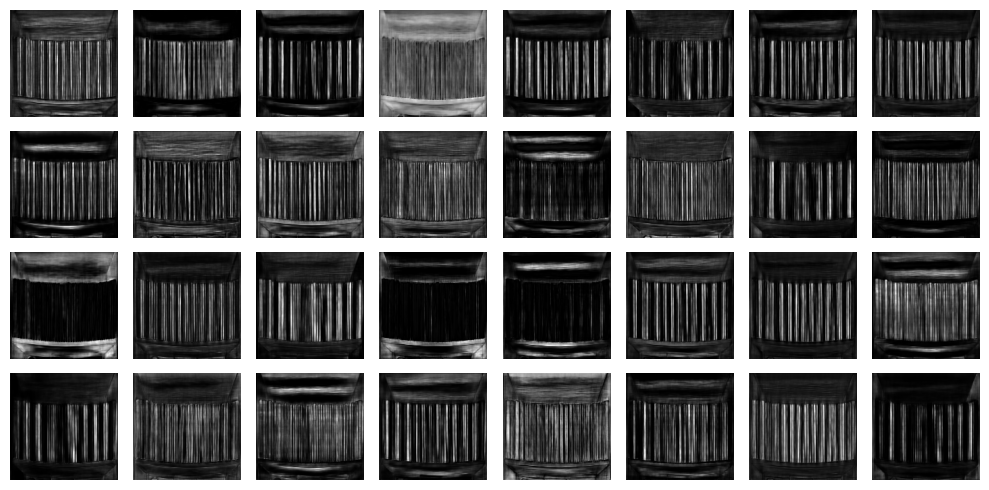

In [134]:
# Code to plot all prototypes 
# Define the number of rows and columns for the grid
num_images = len(prototypes)
num_cols = 8  # Change this according to your preference
num_rows = (num_images + num_cols - 1) // num_cols

# Plot the images
fig, axes = plt.subplots(num_rows, num_cols, figsize=(10, 5))

for i, ax in enumerate(axes.flat):
    if i < num_images:
        ax.imshow(prototypes[i], cmap='gray')
        ax.axis('off')
    else:
        ax.axis('off')  # Hide axes for empty subplots

plt.tight_layout()
plt.show()

In [75]:
def nms(bounding_boxes, threshold):
    # If no bounding boxes, return empty list
    if len(bounding_boxes) == 0:
        return []

    # Bounding boxes
    boxes = np.array(bounding_boxes)
    # Extracting coordinates
    x_mid = boxes[:, 0]
    y_mid = boxes[:, 1]
    width = boxes[:, 2]
    height = boxes[:, 3]
    
    # Calculating start and end coordinates
    start_x = x_mid - width / 2
    start_y = y_mid - height / 2
    end_x = x_mid + width / 2
    end_y = y_mid + height / 2
    score=boxes[:, 4]


    # Picked bounding boxes
    picked_boxes = []
    picked_score = []

    # Compute areas of bounding boxes
    areas = (end_x - start_x + 1) * (end_y - start_y + 1)

    # Sort by confidence score of bounding boxes
    order = np.argsort(score)

    # Iterate bounding boxes
    while order.size > 0:
        # The index of largest confidence score
        index = order[-1]

        # Pick the bounding box with largest confidence score
        picked_boxes.append(bounding_boxes[index])

        # Compute ordinates of intersection-over-union(IOU)
        x1 = np.maximum(start_x[index], start_x[order[:-1]])
        x2 = np.minimum(end_x[index], end_x[order[:-1]])
        y1 = np.maximum(start_y[index], start_y[order[:-1]])
        y2 = np.minimum(end_y[index], end_y[order[:-1]])

        # Compute areas of intersection-over-union
        w = np.maximum(0.0, x2 - x1 + 1)
        h = np.maximum(0.0, y2 - y1 + 1)
        intersection = w * h

        # Compute the ratio between intersection and union
        ratio = intersection / (areas[index] + areas[order[:-1]] - intersection)

        left = np.where(ratio < threshold)
        order = order[left]

    return np.array(picked_boxes)
classes = {4: "book`"}
nb_class=output_0.shape[0]-4-prototypes.shape[0] # extract total number of classes
l_class=[[] for k in range(nb_class)]
output_0_T=output_0.T # so it become shape (8400 116)
threshold_detection=0.2 #threshold to filter irrelevent detection
theshold_iou=0.5 #threshold for NMS algo
for detection in output_0_T:
    conf=detection[4:nb_class+4] #extract all class confidence values for one detecton
    max_conv=np.max(conf) #maximum confidence value
    argmax_conv=np.argmax(conf)#class of the maximum confidence value
    if(max_conv>threshold_detection):
        l_class[argmax_conv].append(np.concatenate((detection[:4], np.array([max_conv]),detection[4+nb_class:])))
l_class_NMS=[]  
for clas in l_class:
    l_class_NMS.append(nms(clas,theshold_iou))  

In [76]:
from skimage.transform import resize

def crop_image(image, box):
    x, y, w, h = box.astype(int)
    
    # Ensure box coordinates are within image boundaries
    x1 = max(0, x - w // 2)
    y1 = max(0, y - h // 2)
    x2 = min(image.shape[1], x + w // 2)
    y2 = min(image.shape[0], y + h // 2)
    
    # Create a mask to zero out areas outside the box
    mask = np.zeros_like(image, dtype=np.float32)
    mask[y1:y2, x1:x2] = 1
    
    # Apply the mask to the original image
    cropped_image = image * mask
    
    return cropped_image

def threshold_image(image,threshold=0.1):
    thresholded_image = np.where(image > threshold, 255,0)
    return thresholded_image





input_size = (640, 640)
classes = {4: "book"}
l_mask=[]
l_class=[]
l_conf=[]
for k in range(len(l_class_NMS)): #for all 80 classes
    for detection in l_class_NMS[k]: #for all detections for 1 class
        coeff=detection[5:] #extract coefficents
        mask=prototypes*coeff.reshape(prototypes.shape[0],1,1) #appy coefficients to the prototypes

        # Initialize an empty array to store resized images
        resized_mask = np.empty((mask.shape[0], input_size[0], input_size[0]))
        
        # Resize each image in the array
        for i, image in enumerate(mask):
            resized_mask[i] = resize(image, input_size, anti_aliasing=True)
        l_mask.append(threshold_image(crop_image(np.mean(resized_mask, axis=0),detection[:4])))#final mask of the object
        l_class.append(k)#add the class index as
        l_conf.append(detection[4])#add the confidence value associated


#########show mask results
# Determine the number of subplots needed
num_plots = len(l_mask)

# Calculate the number of rows and columns for the subplot grid
num_rows = 1  # Number of rows
num_cols = num_plots  # Number of columns

# Create a figure and a grid of subplots
fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 5))

# Iterate over each subplot
for k, ax in enumerate(axes):
    ax.imshow(l_mask[k], cmap='gray')
    title = f"{classes[l_class[k]]} conf: {l_conf[k]:.2f}"
    ax.set_title(title)
    ax.axis('off')  # Turn off axis

plt.tight_layout()  # Adjust layout
plt.show()

KeyboardInterrupt: 

In [16]:
def sigmoid(x):
        return 1 / (1 + np.exp(-x))

def crop_mask(masks, bboxes):
    """
    Crop the masks using the bounding boxes.
    Args:
    masks (np.ndarray): [n, h, w]
    bboxes (np.ndarray): [n, 4]
    Returns:
    (np.ndarray): Cropped masks.
    """
    n, h, w = masks.shape
    cropped_masks = np.zeros_like(masks)
    for i in range(n):
        x1, y1, x2, y2 = bboxes[i]
        cropped_masks[i, y1:y2, x1:x2] = masks[i, y1:y2, x1:x2]
    return cropped_masks

def display_image(image):
    import matplotlib.pyplot as plt
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    plt.imshow(image)
    plt.axis("off")
    plt.show()

In [26]:
import time
import cv2
import numpy as np
import onnxruntime as ort

class YOLO_model:
    """
    YOLO model class for book detection
    """
    def __init__(self, model_path):
        self.init_model(model_path)
        self.confidence_threshold = 0.3
        self.iou_threshold = 0.5

    def init_model(self, model_path):
        self.ort_session = ort.InferenceSession(model_path)
        self.input_name = self.ort_session.get_inputs()[0].name
        self.output0_name = self.ort_session.get_outputs()[0].name
        self.output1_name = self.ort_session.get_outputs()[1].name
    
    def preprocess(self, image):
        self.image_height, self.image_width, _ = image.shape
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        # Resize the image to the model input size
        img = cv2.resize(image, (640, 640))
        # Normalize the image
        img = img.astype(np.float32) / 255.0
        # Change to CHW format
        img = np.transpose(img, (2, 0, 1))
        # Add batch dimension
        input_tensor = np.expand_dims(img, axis=0)
        return input_tensor

    def inference(self, input_tensor, verbose=False):
        start = time.perf_counter()
        outputs = self.ort_session.run(None, {self.input_name: input_tensor})
        if verbose:
            print(f"Inference time: {(time.perf_counter() - start)*1000:.2f} ms")
        return outputs
    
    def post_process(self, output0, output1):
        # Remove the batch axis, and transpose the output
        predictions = np.squeeze(output0).T
        prototypes = np.squeeze(output1)
        num_classes = predictions.shape[1] - 4 - prototypes.shape[0]
        assert num_classes == 1, "Only one class (book) is supported"
        # Extract the class predictions
        class_predictions = np.squeeze(predictions[:, 4:4+num_classes])
        # Extract the bounding box predictions
        bounding_boxes = predictions[:, :4]
        # Extract the prototype coefficients
        prototype_coefficients = predictions[:, 4+num_classes:]
        # Apply NMS to the bounding boxes
        indices = cv2.dnn.NMSBoxes(bounding_boxes, class_predictions, self.confidence_threshold, self.iou_threshold)

        # Extract the detections
        detections = []
        masks_in = []
        X_factor = self.image_width / 640
        Y_factor = self.image_height / 640
        for i in indices.flatten():
            box = bounding_boxes[i]
            score = class_predictions[i]
            class_id = 0
            cx, cy, w, h = box
            x1 = cx - w / 2
            y1 = cy - h / 2
            x2 = cx + w / 2
            y2 = cy + h / 2
            x1 = int(x1 * X_factor)
            y1 = int(y1 * Y_factor)
            x2 = int(x2 * X_factor)
            y2 = int(y2 * Y_factor)
            detections.append([x1, y1, x2, y2, score, class_id])
            masks_in.append(prototype_coefficients[i])
        masks = self.process_mask_upsample(prototypes, masks_in, [detection[:4] for detection in detections])
        return detections, masks

    def process_mask(self, protos, masks_in, bboxes):
        """
        Takes the output of the mask head, and applies the mask to the bounding boxes. This produces masks of lower
        quality but is faster.

        Args:
        protos (np.ndarray): [mask_dim, mask_h, mask_w]
        masks_in (np.ndarray): [n, mask_dim], n is number of masks after nms
        bboxes (np.ndarray): [n, 4], n is number of masks after nms
        shape (tuple): the size of the input image (h,w)
        """
        masks = sigmoid(np.dot(masks_in, protos.reshape(protos.shape[0], -1)))
        masks = masks.reshape(-1, *protos.shape[1:])
        masks = crop_mask(masks, bboxes)
        return masks > 0.5
        
    def process_mask_upsample(self, protos, masks_in, bboxes):
        """
        Takes the output of the mask head, and applies the mask to the bounding boxes. This produces masks of higher
        quality but is slower.

        Args:
        protos (np.ndarray): [mask_dim, mask_h, mask_w]
        masks_in (np.ndarray): [n, mask_dim], n is number of masks after nms
        bboxes (np.ndarray): [n, 4], n is number of masks after nms
        shape (tuple): the size of the input image (h,w)

        Returns:
        (np.ndarray): The upsampled masks.
        """
        c, mh, mw = protos.shape  # CHW
        masks = sigmoid(np.dot(masks_in, protos.reshape(c, -1))).reshape(-1, mh, mw)
        masks = cv2.resize(masks.transpose(1, 2, 0), (self.image_width, self.image_height), interpolation=cv2.INTER_LINEAR).transpose(2, 0, 1)
        masks = crop_mask(masks, bboxes)  # CHW
        return masks > 0.5
        
    def draw_bboxes(self, image, detections):
        """
        Draw bounding boxes and labels on the input image based on the detected objects.

        Args:
        image (np.ndarray): The input image.
        detections (list): The list of detections.
        """
        for detection in detections:
            x1, y1, x2, y2, score, class_id = detection
            # Cast all floats to int
            if class_id == 0:
                color = [0, 255, 0]
                font = cv2.FONT_HERSHEY_SIMPLEX
                cv2.rectangle(image, (int(x1), int(y1)), (int(x2), int(y2)), color, 2)
                label = f"book: {score:.2f}"
                (label_width, label_height), _ = cv2.getTextSize(label, font, 0.5, 1)
                label_x = x1
                label_y = y1 - 10 if y1 - 10 > label_height else y1 + 10
                cv2.rectangle(image, (label_x, label_y - label_height), (label_x + label_width, label_y + label_height), color, cv2.FILLED)
                cv2.putText(image, label, (label_x, label_y), font, 0.5, (0, 0, 0), 1, cv2.LINE_AA)
        
        return image
    
    def draw_masks(self, image, masks):
        """
        Draw masks on the input image.

        Args:
        image (np.ndarray): The input image.
        masks (list): The list of masks.
        """
        for mask in masks:
            image[mask] = [127, 0, 127]
        return image
    
    def detect_books(self, image, verbose=False):
        """
        Detect books in an image.

        Args:
        image (np.ndarray): The input image.
        verbose (bool): Whether to print additional information.
        """
        input_tensor = self.preprocess(image)
        output0, output1 = self.inference(input_tensor, verbose)
        detections,  masks = self.post_process(output0, output1)
        return detections, masks

In [31]:
OpenShelves8 = YOLO_model("OpenShelves8.onnx")
image = cv2.imread("../../images/Shelves/1539_2.jpg")
detections, masks = OpenShelves8.detect_books(image)

In [32]:
print(len(detections))
print(len(masks))
# OpenShelves8.draw_bboxes(image, detections)
# OpenShelves8.draw_masks(image, masks)

32
32


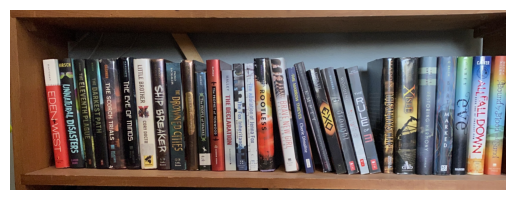

In [33]:
display_image(image)

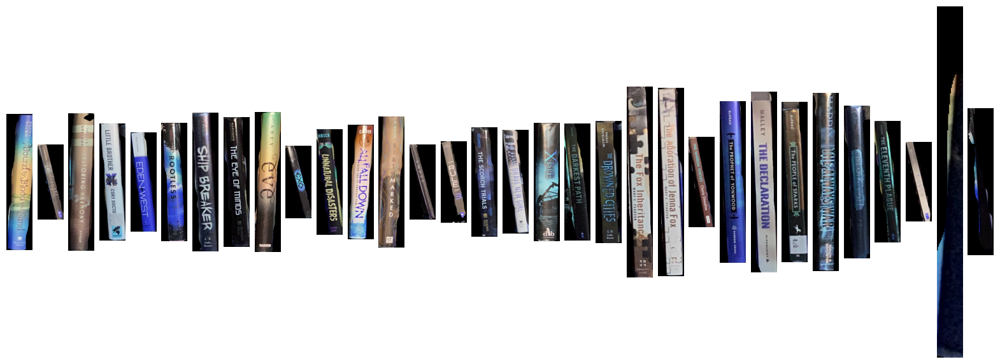

In [22]:
# Segment the books 
def segment_books(image, detections, masks):
    books = []
    for detection, mask in zip(detections, masks):
        x1, y1, x2, y2, _, _ = detection
        book = image[y1:y2, x1:x2]
        mask = mask.astype(np.uint8)[y1:y2, x1:x2]
        book = cv2.bitwise_and(book, book, mask=mask)
        #crop 
        books.append(book)
    return books

books = segment_books(image,detections, masks)

display_segmented_books(books)

In [38]:
import cv2

# Initialize the webcam
cap = cv2.VideoCapture(0)

# Initialize YOLOv7 object detector
model_path = "OpenShelves8.onnx"
OpenShelves8 = YOLO_model(model_path)

cv2.namedWindow("Detected Objects", cv2.WINDOW_NORMAL)
while cap.isOpened():

    # Read frame from the video
    ret, frame = cap.read()

    if not ret:
        break

    # Update object localizer
    print(frame.shape)
    print(type(frame))
    detections, masks = OpenShelves8.detect_books(frame)

    combined_img = OpenShelves8.draw_bboxes(frame, detections)
    cv2.imshow("Detected Objects", combined_img)

    # Press key q to stop
    if cv2.waitKey(1) & 0xFF == ord('q'):
        break

[ WARN:0@1670.467] global cap_v4l.cpp:999 open VIDEOIO(V4L2:/dev/video0): can't open camera by index
[ERROR:0@1670.467] global obsensor_uvc_stream_channel.cpp:158 getStreamChannelGroup Camera index out of range


# Ultralytics yolov8


In [98]:
from ultralytics import YOLO
import cv2


In [105]:
model = YOLO("OpenShelves8.onnx", task="detect", verbose=True)

In [106]:
from PIL import Image
image = Image.open("../../images/Shelves/1538_1.jpg")

In [107]:
results = model.predict(source=image, save=True, save_txt=True)  # save predictions as labels

Loading OpenShelves8.onnx for ONNX Runtime inference...


Preferring ONNX Runtime TensorrtExecutionProvider
*************** EP Error ***************
EP Error /onnxruntime_src/onnxruntime/python/onnxruntime_pybind_state.cc:507 void onnxruntime::python::RegisterTensorRTPluginsAsCustomOps(PySessionOptions&, const onnxruntime::ProviderOptions&) Please install TensorRT libraries as mentioned in the GPU requirements page, make sure they're in the PATH or LD_LIBRARY_PATH, and that your GPU is supported.
 when using ['TensorrtExecutionProvider', 'CUDAExecutionProvider', 'CPUExecutionProvider']
Falling back to ['CUDAExecutionProvider', 'CPUExecutionProvider'] and retrying.
****************************************



2024-11-14 09:35:26.700467354 [E:onnxruntime:Default, provider_bridge_ort.cc:1848 TryGetProviderInfo_TensorRT] /onnxruntime_src/onnxruntime/core/session/provider_bridge_ort.cc:1539 onnxruntime::Provider& onnxruntime::ProviderLibrary::Get() [ONNXRuntimeError] : 1 : FAIL : Failed to load library libonnxruntime_providers_tensorrt.so with error: libnvinfer.so.10: cannot open shared object file: No such file or directory

2024-11-14 09:35:26.758877190 [E:onnxruntime:Default, provider_bridge_ort.cc:1862 TryGetProviderInfo_CUDA] /onnxruntime_src/onnxruntime/core/session/provider_bridge_ort.cc:1539 onnxruntime::Provider& onnxruntime::ProviderLibrary::Get() [ONNXRuntimeError] : 1 : FAIL : Failed to load library libonnxruntime_providers_cuda.so with error: libcudnn_adv.so.9: cannot open shared object file: No such file or directory

2024-11-14 09:35:26.758905825 [W:onnxruntime:Default, onnxruntime_pybind_state.cc:993 CreateExecutionProviderInstance] Failed to create CUDAExecutionProvider. Requir

RuntimeError: Error when binding input: There's no data transfer registered for copying tensors from Device:[DeviceType:1 MemoryType:0 DeviceId:0] to Device:[DeviceType:0 MemoryType:0 DeviceId:0]

In [103]:
import onnxruntime as ort
ort.get_available_providers()

['TensorrtExecutionProvider', 'CUDAExecutionProvider', 'CPUExecutionProvider']